In [9]:
import pandas as pd
import numpy as np
import csv
import networkx as nx
from operator import itemgetter
import community
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
plt.style.use('seaborn-bright')

### Preparing Data 

#### US Programs Metadata

In [10]:
meta = pd.read_csv('programs_meta.csv')
meta['Name'] = meta['Name'].str.lower()
#Rank: average of R-Rank: 
#Programs are ranked highly if they have similar features to programs viewed by faculty as top-notch.
#meta['Rank'] = meta['Rank']).round(0)
meta['Rank'] = len(meta)+1-meta['Rank'].rank(method='max')
meta.sort_values(by=['Rank'], ascending=False).head(10)

,ID,Name,Rank,Private,Size,City,Space,FS,International,Citations,FacultySize,Time,Aca%,NonAca%,GradNum,TolIndex,AvgIndex,Tier
21,24,harvard university,104.0,1,4,1,0,1.00,0.51,4.21,66,5.00,0.67,0.33,219,46078.2,210.40,1
59,65,university of chicago,103.0,1,4,1,0,0.55,0.73,3.34,70,5.50,0.60,0.40,121,13319.6,110.08,1
28,31,massachusetts institute of technology,102.0,1,4,1,1,0.96,0.58,3.25,46,4.80,0.74,0.26,136,32221.0,236.92,1
51,57,university of california-berkeley,101.0,0,4,1,0,0.50,0.34,2.83,60,5.70,0.70,0.30,149,19732.6,132.43,1
37,41,princeton university,100.0,1,4,0,0,1.00,0.71,3.04,47,5.20,0.62,0.38,156,16353.8,104.83,1
30,33,new york university,98.0,1,4,1,1,1.00,0.86,2.24,59,5.67,0.73,0.27,114,11618.0,101.91,1
43,48,stanford university,98.0,1,4,1,0,0.83,0.61,2.81,73,6.00,0.63,0.37,147,23036.0,156.71,1
103,110,yale university,97.0,1,4,1,0,1.00,0.67,1.68,43,5.20,0.78,0.22,139,19201.8,138.14,1
72,78,university of maryland college park,96.0,0,4,0,1,0.95,0.71,1.95,52,5.30,0.39,0.61,122,3291.2,26.98,2
85,91,university of pennsylvania,94.0,1,4,1,1,0.23,0.77,2.21,46,4.90,0.66,0.34,128,8138.2,63.58,1


In [11]:
meta.describe()

,ID,Rank,Private,Size,City,Space,FS,International,Citations,FacultySize,Time,Aca%,NonAca%,GradNum,TolIndex,AvgIndex,Tier
count,104.000000,104.000000,104.000000,104.000000,104.000000,104.000000,104.000000,104.000000,104.000000,104.000000,104.000000,104.000000,104.000000,104.000000,104.000000,104.000000,104.000000
mean,56.423077,52.259615,0.326923,2.605769,0.576923,0.375000,0.700673,0.638173,1.198558,31.625000,5.515000,0.652500,0.347596,59.394231,3576.419231,40.440385,3.461538
std,31.491004,30.169745,0.471361,1.092057,0.496440,0.486467,0.279703,0.196636,0.792733,16.980393,0.776348,0.158186,0.158049,44.822285,6847.360509,42.971767,1.371861
min,2.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.150000,10.000000,3.000000,0.290000,0.000000,1.000000,0.000000,0.000000,1.000000
25%,28.750000,26.000000,0.000000,2.000000,0.000000,0.000000,0.495000,0.527500,0.657500,18.000000,5.000000,0.570000,0.247500,28.000000,487.800000,15.482500,2.000000
50%,57.500000,52.500000,0.000000,3.000000,1.000000,0.000000,0.770000,0.690000,0.995000,28.000000,5.500000,0.645000,0.355000,46.000000,1060.700000,27.295000,4.000000
75%,83.250000,78.250000,1.000000,4.000000,1.000000,1.000000,1.000000,0.770000,1.470000,39.000000,6.000000,0.752500,0.430000,80.250000,2892.700000,46.370000,5.000000
max,110.000000,104.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.980000,4.210000,88.000000,8.000000,1.000000,0.710000,219.000000,46078.200000,236.920000,5.000000


#### US Top 100 Placement Data 

In [12]:
df = pd.read_csv('usdata.csv')
#df['Weight'] = df['Target'].map(meta.set_index('Name')['Rank'])
df.rename(columns={'Scores':'Weight'}, inplace=True)
df['Year'] = pd.to_datetime(df['Year'], format = '%Y').dt.year
df.head()

,Unnamed: 0,ID,Source,Year,Target,Weight
0,11,2,arizona state university,2011.0,university of california-santa barbara,88.0
1,14,2,arizona state university,2014.0,washington university in st. louis,110.0
2,20,4,boston college,2011.0,clark university,4.0
3,24,4,boston college,2017.0,wayne state university,10.0
4,27,4,boston college,2012.0,washington state university,17.0


In [13]:
df.shape

(832, 6)

#### Global Placement Data

In [14]:
glo = pd.read_csv('GlobalPlacement.csv').dropna()
glo.rename(columns={'Scores':'Weight', 'Placement':'Target'}, inplace=True)
glo['Year'] = pd.to_datetime(glo['Year'], format = '%Y').dt.year
glo.head()

,Unnamed: 0,ID,Source,Year,Target,Weight
0,0,2,arizona state university,2011,hofstra university,2.0
1,1,2,arizona state university,2015,university of winnipeg,4.0
2,2,2,arizona state university,2014,nanjing university school of business,10.0
3,3,2,arizona state university,2011,yeshiva university,11.0
4,4,2,arizona state university,2016,virginia commonwealth university,14.0


In [15]:
glo.shape

(3631, 6)

In [16]:
## Subdata of different years
def subdata(df):
    df10 = df[df['Year']==2010]
    df11 = df[df['Year']==2011]
    df12 = df[df['Year']==2012]
    df13 = df[df['Year']==2013]
    df14 = df[df['Year']==2014]
    df15 = df[df['Year']==2015]
    df16 = df[df['Year']==2016]
    df17 = df[df['Year']==2017]

    subdf = [df10, df11, df12, df13, df14, df15, df16, df17]
    
    return subdf

subdf = subdata(df)
subglo = subdata(glo)

### Macro Trend of Econ Job Market

#### US Market

In [17]:
yrlabs = ['2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017']

In [18]:
yearagg = df.groupby('Year').agg({'Year':'count', 'Weight':'mean'})

#### Global Market

In [19]:
yearaggglo = glo.groupby('Year').agg({'Year':'count', 'Weight':'mean'})[:8]

#### Plots

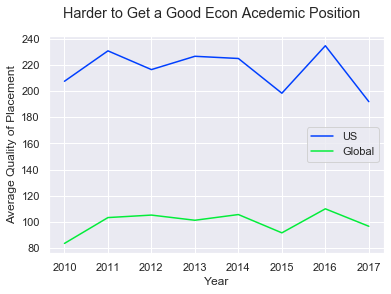

In [20]:
plt.plot(yrlabs, "Weight", data=yearagg, label='US')
plt.plot(yrlabs, "Weight", data=yearaggglo, label='Global')

plt.suptitle('Harder to Get a Good Econ Acedemic Position')
plt.xlabel('Year')
plt.ylabel('Average Quality of Placement')
plt.legend()
plt.savefig('agg_year_quality.png')

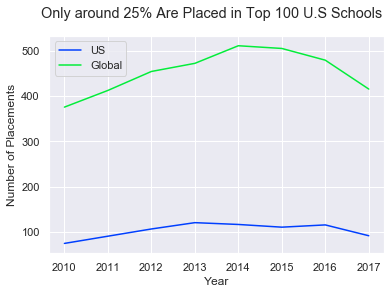

In [21]:
plt.plot(yrlabs, "Year", data=yearagg, label='US')
plt.plot(yrlabs, "Year", data=yearaggglo, label='Global')
#plt.suptitle('Number of New Econ Graduates Who Got Top 100 US Academic Placements')
plt.suptitle('Only around 25% Are Placed in Top 100 U.S Schools')
plt.xlabel('Year')
plt.ylabel('Number of Placements')
plt.legend()
plt.savefig('agg_year_number.png')

### Create a Directed Graph

In [411]:
## weights: aggregate counts of placements across years
aggplacements = glo.groupby(['Source', 'Target']).agg({'ID':'count'})
aggplacements.rename(columns={'ID':'Counts'}, inplace=True)
aggplacements.reset_index(level=['Source', 'Target'], inplace=True)
aggplacements.sort_values(by=['Counts'], ascending=False).head(5)

,Source,Target,Counts
592,harvard university,university of chicago,12
597,harvard university,university of pennsylvania,10
579,harvard university,stanford university,7
833,massachusetts institute of technology,university of illinois,7
96,boston university,shanghai university of finance and economics,6


In [412]:
def newnetwork(df, verbose=True):
    '''
    This function creates a new directed graph object by adding nodes, edges, and weights.
    '''
   
    #nodes
    node_names = list(set([i for i in df['Target'].unique()] + 
                          [i for i in df['Source'].unique()]))
    
    #edges
    edges = [(df.iloc[i]['Source'], df.iloc[i]['Target']) for i in range(len(df))]
    
    
    #initialize a Graph object
    G = nx.DiGraph(directed=True)

    #add lists of nodes and edges
    G.add_nodes_from(node_names)
    G.add_edges_from(edges)

    #basic information about your newly-created network
    if verbose==True:
        print('Number of Nodes:', len(node_names))
        print('Number of Edges:', len(edges))
        print(nx.info(G))
    
    #add edges weight (aggregate counts of placements)
    aggplacements = df.groupby(['Source', 'Target']).agg({'ID':'count'})
    aggplacements.rename(columns={'ID':'Counts'}, inplace=True)
    aggplacements.reset_index(level=['Source', 'Target'], inplace=True)
    
    for i in G.edges:
        weight = int(aggplacements[(aggplacements['Source']==i[0]) & 
                  (aggplacements['Target']==i[1])].Counts)
        G.edges[i[0], i[1]]['weight'] = weight
        
    #The set_node_attributes function takes three variables: 
    #1. the Graph to which you’re adding the attribute
    #2. the dictionary of id-attribute pairs
    #3. the name of the new attribute.

    for i in meta.columns[2:]:
        nx.set_node_attributes(G, meta.set_index('Name').to_dict()[i], i)
        
    return G

In [413]:
G = newnetwork(df)

Number of Nodes: 100
Number of Edges: 832
Name: 
Type: DiGraph
Number of nodes: 100
Number of edges: 599
Average in degree:   5.9900
Average out degree:   5.9900


In [414]:
GG = newnetwork(glo)

Number of Nodes: 2096
Number of Edges: 3631
Name: 
Type: DiGraph
Number of nodes: 2096
Number of edges: 3224
Average in degree:   1.5382
Average out degree:   1.5382


In [415]:
print(G.nodes['university of chicago'])

{'Rank': 103.0, 'Private': 1, 'Size': 4, 'City': 1, 'Space': 0, 'FS': 0.55, 'International': 0.73, 'Citations': 3.34, 'FacultySize': 70, 'Time': 5.5, 'Aca%': 0.6, 'NonAca%': 0.4, 'GradNum': 121, 'TolIndex': 13319.6, 'AvgIndex': 110.08, 'Tier': 1}


In [416]:
subG = [newnetwork(i, False) for i in subdf]
subGglo = [newnetwork(i, False) for i in subglo]

### Network Statistics

#### Self-loop
Is it common to be hired by where they graduate from?

In [417]:
def selfloop(df):
    sameratios=[]
    for i in subdf:
        sameratios.append(len(i[i['Source']==i['Target']])/len(df))
    plt.plot(yrlabs, sameratios)
    plt.xlabel('Year')
    plt.ylabel('Average Number of Graduates')

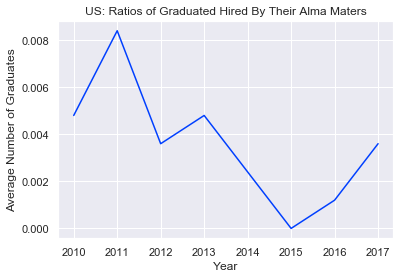

In [418]:
selfloop(df)
plt.title('US: Ratios of Graduated Hired By Their Alma Maters')
plt.savefig('selfloopus.png')

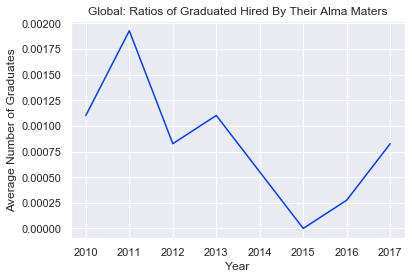

In [419]:
selfloop(glo)
plt.title('Global: Ratios of Graduated Hired By Their Alma Maters')
plt.savefig('selfloopglobal.png')

#### Network density
The ratio of actual edges in the network to all possible edges in the network. (how closely knit your network is)

A 0 would mean that there are no connections at all, and a 1 would indicate that all possible edges are present (a perfectly connected network)

In [420]:
density = nx.density(G)
print("Network density:", density)

Network density: 0.060505050505050506


In [421]:
nx.density(G)/nx.density(GG)

82.40847933428579

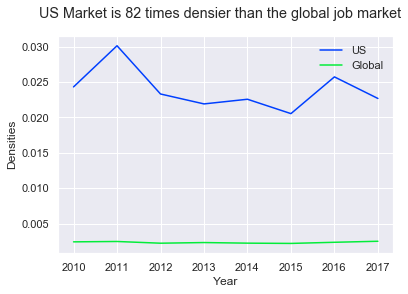

In [422]:
plt.plot(yrlabs, [nx.density(i)  for i in subG], label='US')
plt.plot(yrlabs, [nx.density(i)  for i in subGglo], label='Global')
plt.suptitle('US Market is 82 times densier than the global job market')
plt.xlabel('Year')
plt.ylabel('Densities')
plt.legend()
plt.savefig('densities.png')

#### Shortest path
calculates the shortest possible series of nodes and edges that stand between any two nodes

In [423]:
path = nx.shortest_path(G, source="university of chicago", target="indiana university at bloomington")

print("Shortest path:", path)

print("Length of that path:", len(path)-1)

Shortest path: ['university of chicago', 'duke university', 'georgia state university', 'indiana university at bloomington']
Length of that path: 3


#### Transitivity
Transitivity is the ratio of all triangles over all possible triangles. 

Transitivity, like density, expresses how interconnected a graph is in terms of a ratio of actual over possible connections. 

Because the graph is not very dense, there are fewer possible triangles to begin with, which may result in slightly higher transitivity

In [424]:
triadic_closure = nx.transitivity(G)
print("Triadic closure:", triadic_closure)

Triadic closure: 0.16130057191273037


In [425]:
nx.transitivity(G)/nx.transitivity(GG)

23.289183681923667

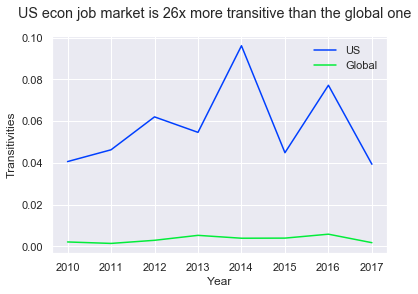

In [426]:
plt.plot(yrlabs, [nx.transitivity(i)  for i in subG], label='US')
plt.plot(yrlabs, [nx.transitivity(i)  for i in subGglo], label='Global')
plt.suptitle('US econ job market is 26x more transitive than the global one')
plt.xlabel('Year')
plt.ylabel('Transitivities')
plt.legend()
plt.savefig('transitivity.png')

#### Degrees
A node’s degree is the sum of its edges. 

In [427]:
def adddegrees(G):
    degree_dict = dict(G.degree(G.nodes()))
    nx.set_node_attributes(G, degree_dict, 'degree')
    #Outward ties reflect the capacity of the sending department to place its own students
    #Inward ties reflect the capacity of the receiving department to hire and retain faculty. 
    outdegree = {}
    indegree = {}
    for i in df['Source'].unique():
        outdegree[i] = G.out_degree(i)
        indegree[i] = G.in_degree(i)

    nx.set_node_attributes(G, outdegree, 'outdegree')
    nx.set_node_attributes(G, indegree, 'indegree')
    
    #use the built-in function sorted() to sort a dictionary by its keys or values and find the top twenty nodes ranked by degree. 
    #sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
    #sorted_outdegree = sorted(outdegree.items(), key=itemgetter(1), reverse=True)
    #sorted_indegree = sorted(indegree.items(), key=itemgetter(1), reverse=True)
    #print("Top 10 nodes by degree:")
     #   for d in sorted_degree[:10]:
      #      print(d)

    return G

In [428]:
G = adddegrees(G)
GG = adddegrees(GG)

##### Degrees Visualization

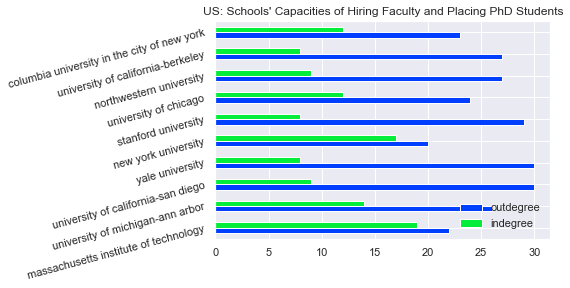

In [440]:
inout = pd.DataFrame.from_dict(dict(G.nodes(data=True)), orient='index')[['degree','outdegree', 'indegree']]
inoutsorted = inout.sort_values(by=['degree'], ascending=False)[['outdegree', 'indegree']].head(10)
inoutsorted.plot.barh(rot=15, title="US: Schools' Capacities of Hiring Faculty and Placing PhD Students")
plt.savefig('inoutdegrees.png')

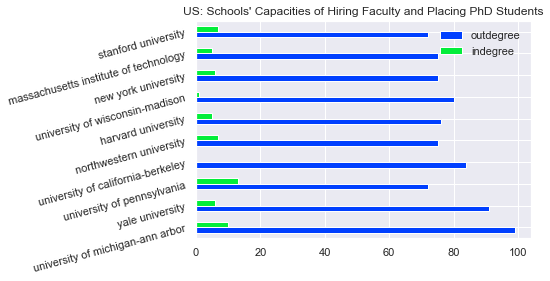

In [438]:
inoutglo = pd.DataFrame.from_dict(dict(GG.nodes(data=True)), orient='index')[['degree','outdegree', 'indegree']]
inoutsortedglo = inoutglo.sort_values(by=['degree'], ascending=False)[['outdegree', 'indegree']].head(10)
inoutsortedglo.plot.barh(rot=15, title="Global: Schools' Capacities of Hiring Faculty and Placing PhD Students")
plt.savefig('inoutdegreesglo.png')

### Centrality 

centrality refers to indicators which identify the most important vertices within a graph.

#### Eigenvector centrality 
is a kind of extension of degree—it looks at a combination of a node’s edges and the edges of that node’s neighbors. Eigenvector centrality cares if you are a hub, but it also cares how many hubs you are connected to. It’s calculated as a value from 0 to 1: the closer to one, the greater the centrality. Eigenvector centrality is useful for understanding which nodes can get information to many other nodes quickly. 
 
Eigenvector centrality is a measure of the influence of a node in a network. It assigns relative scores to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes.



#### Betweenness centrality 
looks at all the shortest paths that pass through a particular node. it’s a quick way of giving you a sense of which nodes are important not because they have lots of connections themselves but because they stand between groups, giving the network connectivity and cohesion.

Betweenness is a centrality measure of a vertex within a graph. Betweenness centrality quantifies the number of times a node acts as a bridge along the shortest path between two other nodes.

#### Closeness centrality 

In connected graphs there is a natural distance metric between all pairs of nodes, defined by the length of their shortest paths. The farness of a node is defined as the sum of its distances to all other nodes, and its closeness is defined as the reciprocal of the farness. Thus, the more central a node is the lower its total distance to all other nodes.


Source: https://sites.google.com/a/umn.edu/social-network-analysis/terminology

In [250]:
def addcentralities(G):
    '''
    The function adds three centralities to the nodes attributes of a network
    '''
    betweenness_dict = nx.betweenness_centrality(G) # Run betweenness centrality
    eigenvector_dict = nx.eigenvector_centrality(G) # Run eigenvector centrality
    closeness_dict = nx.closeness_centrality(G) # Run eigenvector centrality

    # Assign each to an attribute in your network
    nx.set_node_attributes(G, betweenness_dict, 'betweenness')
    nx.set_node_attributes(G, eigenvector_dict, 'eigenvector')
    nx.set_node_attributes(G, closeness_dict, 'closeness')  
    
    sorted_eigenvector = sorted(eigenvector_dict.items(), key=itemgetter(1), reverse=True)
    sorted_betweenness = sorted(betweenness_dict.items(), key=itemgetter(1), reverse=True)
    sorted_closeness = sorted(closeness_dict.items(), key=itemgetter(1), reverse=True)
    
    
    #print("Top 10 nodes by eigenvector centrality:")
    #for b in sorted_eigenvector[:10]:
    #    print(b[0],round(b[1],2))

    return G

In [251]:
G = addcentralities(G)
GG = addcentralities(GG)

 which of the high betweenness centrality nodes had low degree? That is to say: which high-betweenness nodes are unexpected? 



In [252]:
#
#First get the top 20 nodes by betweenness as a list
#top_eigenvector = sorted_eigenvector[:30]

#Then find and print their degree
#for tb in top_eigenvector: # Loop through top_betweenness
#    degree = degree_dict[tb[0]] 
#    if degree<10:
#        print("Name:", tb[0], "| Eigenvector Centrality:", tb[1], "| Degree:", degree)

In [253]:
cent = pd.DataFrame.from_dict(dict(G.nodes(data=True)), orient='index')[['betweenness', 'eigenvector', 'closeness']]
centcomp=cent[(cent.index == 'university of chicago') | 
    (cent.index == 'harvard university') |
    (cent.index == 'massachusetts institute of technology')]
centcomp.round(4)

,betweenness,eigenvector,closeness
university of chicago,0.0259,0.1804,0.2391
massachusetts institute of technology,0.2279,0.1993,0.2953
harvard university,0.0104,0.0569,0.2126


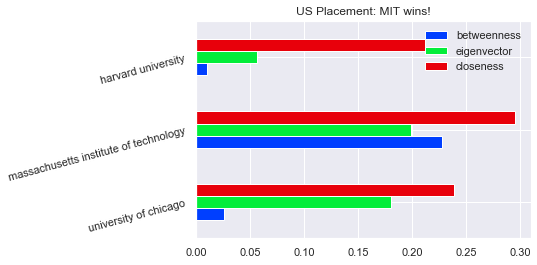

In [313]:
centcomp.plot.barh(rot=15, title="US Placement: MIT wins!")
plt.savefig('centralities.png')

In [255]:
centglo = pd.DataFrame.from_dict(dict(GG.nodes(data=True)), orient='index')[['betweenness', 'eigenvector', 'closeness']]
centcompglo = centglo[(centglo.index == 'university of chicago') | 
    (centglo.index == 'harvard university') |
    (centglo.index == 'massachusetts institute of technology')]
centcompglo.round(4)

,betweenness,eigenvector,closeness
harvard university,0.0008,0.0614,0.0047
massachusetts institute of technology,0.0008,0.0769,0.0053
university of chicago,0.0012,0.0974,0.0056


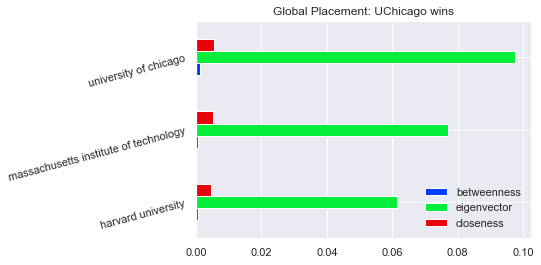

In [312]:
centcompglo.plot.barh(rot=15, title="Global Placement: UChicago wins")
#plt.show()
plt.savefig('centralitiesglobal.png')

### Spatial Location/Cluster

#### A strongly connected component 
is called attracting if it has no outgoing edges whatsoever. 

In [257]:
#In other words, no placement in other universities
att = sorted(nx.attracting_components(G), key=len, reverse=True)

#### Strongly connected components

In [258]:
connected = sorted(nx.strongly_connected_components(G), key=len, reverse=True)

In [259]:
len(connected[0])/len(G.nodes)

0.62

38% of the schools are not strongly connected with others

### Saltwater and freshwater economics

They were called the "freshwater school" because Chicago, Pittsburgh, Rochester, Minneapolis, etc. are located closer to the North American Great Lakes.

The established methodological approach to macroeconomic research was primarily defended by economists at the universities and other institutions located near the east and west coast of the United States. 

https://en.wikipedia.org/wiki/Saltwater_and_freshwater_economics

#### Water ratios

In [260]:
#6
freshwater = ['university of chicago', 'carnegie mellon university', 'northwestern university', 'cornell university', 
              'university of minnesota-twin cities', 'university of rochester']

In [261]:
#7
saltwater = ['university of california-berkeley', 'brown university', 
             'harvard university', 'university of pennsylvania', 'princeton university', 
             'columbia university in the city of new york', 'yale university']

In [262]:
#check list names are the same in the data
for i in saltwater:
    if i not in df['Source'].unique():
        print(i)
        
for i in freshwater:
    if i not in df['Source'].unique():
        print(i)

In [263]:
def freshsalt(df):
    ### fresh/salt graduates
    fnum = len(df[df['Source'].isin(freshwater)])
    snum = len(df[df['Source'].isin(saltwater)])
    print('Number of Graduates:')
    print('fresh:',fnum, 'salt:', snum)
    print('salt/fresh', snum/fnum)    
    
    print('fresh-fresh')
    ff = df[(df['Source'].isin(freshwater)) & df['Target'].isin(freshwater)]
    print("Count:", len(ff), "   ", "Percentage:", round(len(ff)/fnum,2))
    
    print('fresh-salt')
    fs = df[(df['Source'].isin(freshwater)) & df['Target'].isin(saltwater)]
    print("Count:", len(fs), "   ", "Percentage:", round(len(fs)/fnum,2))
    
    print('salt-salt')
    ss = df[(df['Source'].isin(saltwater)) & df['Target'].isin(saltwater)]
    print("Count:", len(ss), "   ", "Percentage:", round(len(ss)/snum,2))
    
    print('salt-fresh')
    sf = df[(df['Source'].isin(saltwater)) & df['Target'].isin(freshwater)]
    print("Count:", len(sf), "   ", "Percentage:", round(len(sf)/snum,2))

In [264]:
freshsalt(df)

Number of Graduates:
fresh: 90 salt: 273
salt/fresh 3.033333333333333
fresh-fresh
Count: 10     Percentage: 0.11
fresh-salt
Count: 14     Percentage: 0.16
salt-salt
Count: 62     Percentage: 0.23
salt-fresh
Count: 48     Percentage: 0.18


In [265]:
freshsalt(glo)

Number of Graduates:
fresh: 266 salt: 637
salt/fresh 2.3947368421052633
fresh-fresh
Count: 7     Percentage: 0.03
fresh-salt
Count: 9     Percentage: 0.03
salt-salt
Count: 49     Percentage: 0.08
salt-fresh
Count: 38     Percentage: 0.06


#### Water networks

In [266]:
waterlist = freshwater + saltwater
water = df[(df['Source'].isin(waterlist)) & (df['Target'].isin(waterlist))]
len(water)

134

In [267]:
water.Source.unique()

array(['brown university', 'columbia university in the city of new york',
       'cornell university', 'harvard university',
       'northwestern university', 'princeton university',
       'university of california-berkeley', 'university of chicago',
       'university of minnesota-twin cities',
       'university of pennsylvania', 'yale university'], dtype=object)

In [268]:
#two schools don't have placements in other water schools
for i in waterlist:
    if i not in water.Source.unique():
        print(i)

carnegie mellon university
university of rochester


In [269]:
waterG = newnetwork(water)

Number of Nodes: 13
Number of Edges: 134
Name: 
Type: DiGraph
Number of nodes: 13
Number of edges: 63
Average in degree:   4.8462
Average out degree:   4.8462


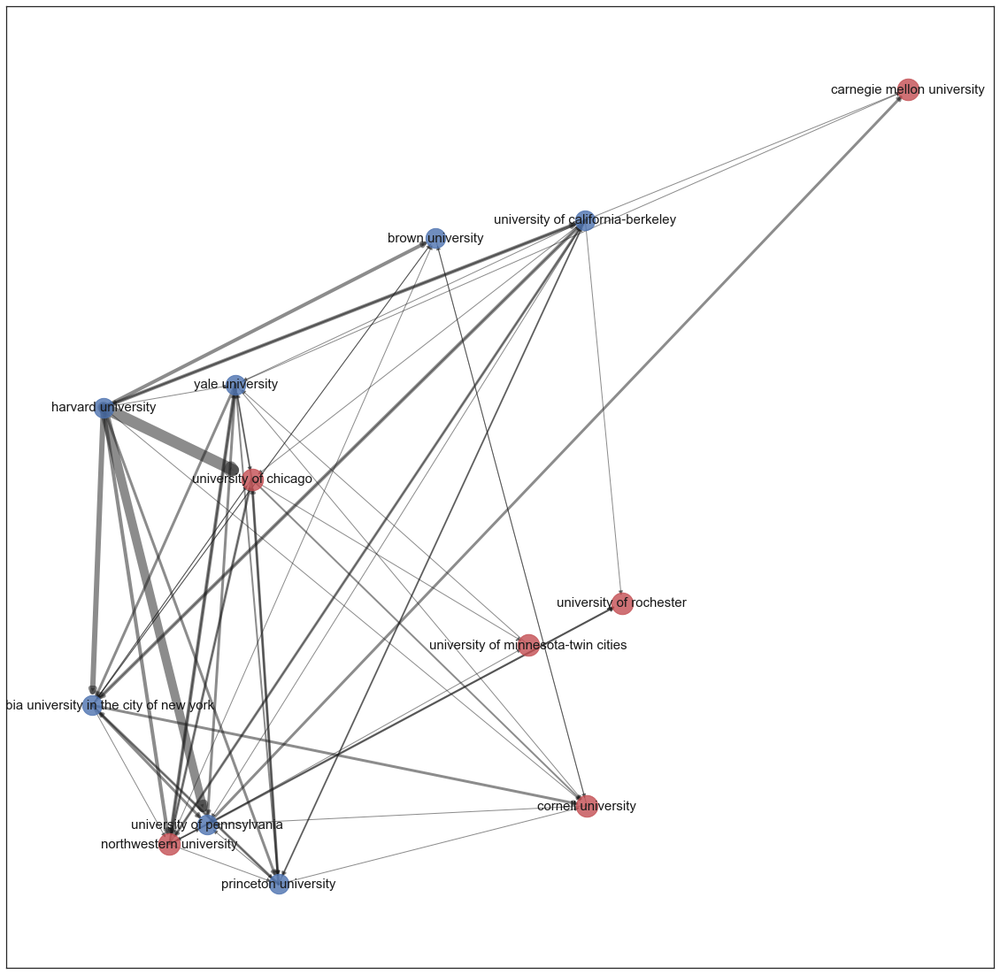

In [270]:
pos=nx.random_layout(G) # positions for all nodes
plt.figure(figsize = (20,20))

# nodes
nx.draw_networkx_nodes(waterG,pos,
                       nodelist=freshwater,
                       node_color='r',
                       node_size=600,
                       alpha=0.8)

nx.draw_networkx_nodes(waterG,pos,
                       nodelist=saltwater,
                       node_color='b',
                       node_size=500,
                       alpha=0.8)

nx.draw_networkx_labels(waterG, pos, font_size=15)


# edges
edgewidth = [d['weight'] for (u,v,d) in waterG.edges(data=True)]

nx.draw_networkx_edges(waterG,pos,width=edgewidth, alpha=0.5)

plt.savefig("water.png", format = "png")

### Network Visualization

core–periphery structure
https://en.wikipedia.org/wiki/Core%E2%80%93periphery_structure#Uses_in_economics

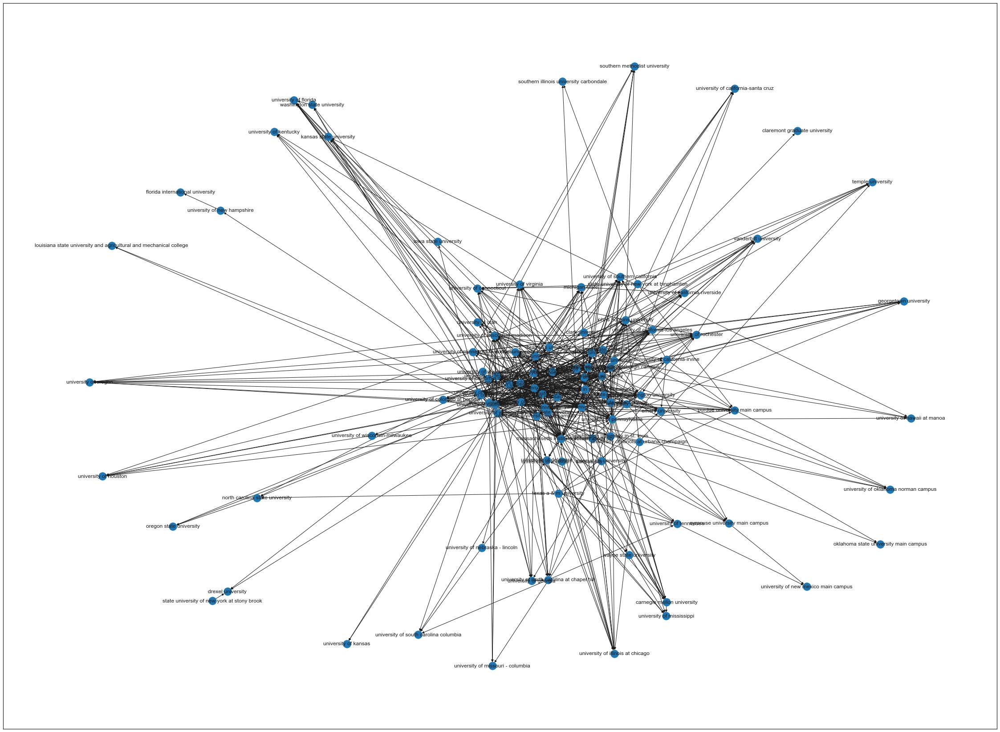

In [271]:
pos = nx.spring_layout(G) 
plt.figure(figsize = (40,30))
nx.draw_networkx(G, pos)
plt.savefig("network.png", format = "png", dpi = 500)

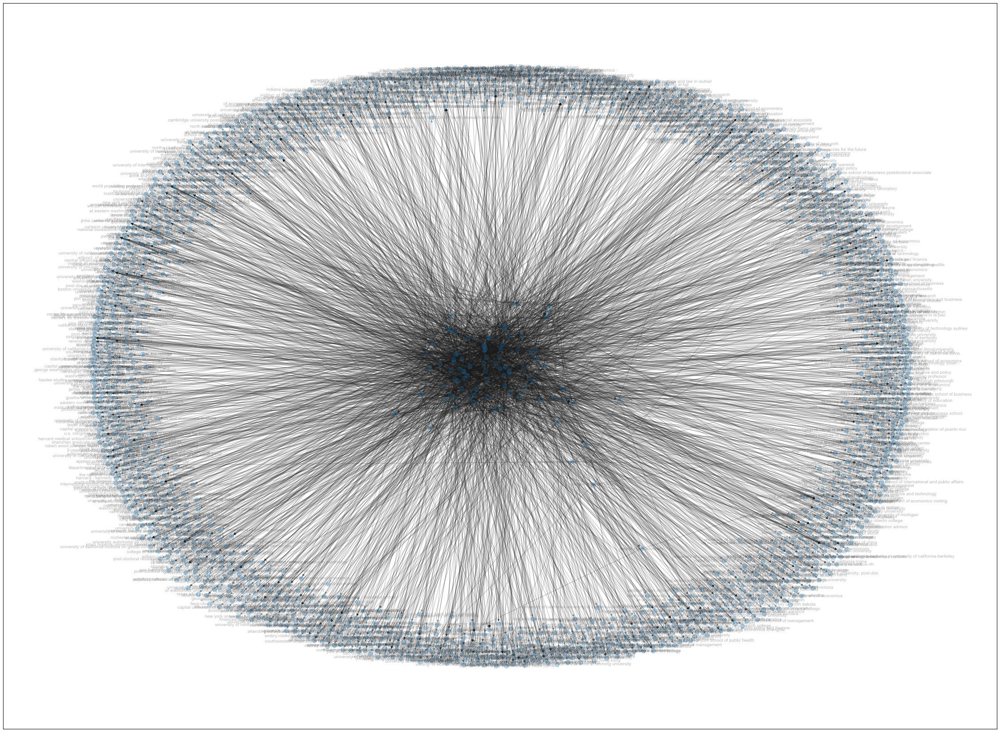

In [272]:
pos = nx.spring_layout(GG) 
plt.figure(figsize = (40,30))
nx.draw_networkx(GG, pos, node_size=100, alpha=0.3, font_size=10)
plt.savefig("networkglobal.png", format = "png", dpi = 500)

In [273]:
#create network plots for all years
for i in range(8):
    plt.figure(figsize = (30,30))
    nx.draw_networkx(subG[i])
    name = "network"+"201"+str(i)+'.png'
    plt.savefig(name, format = "png", dpi=500)
    plt.clf()

<Figure size 2160x2160 with 0 Axes>

<Figure size 2160x2160 with 0 Axes>

<Figure size 2160x2160 with 0 Axes>

<Figure size 2160x2160 with 0 Axes>

<Figure size 2160x2160 with 0 Axes>

<Figure size 2160x2160 with 0 Axes>

<Figure size 2160x2160 with 0 Axes>

<Figure size 2160x2160 with 0 Axes>

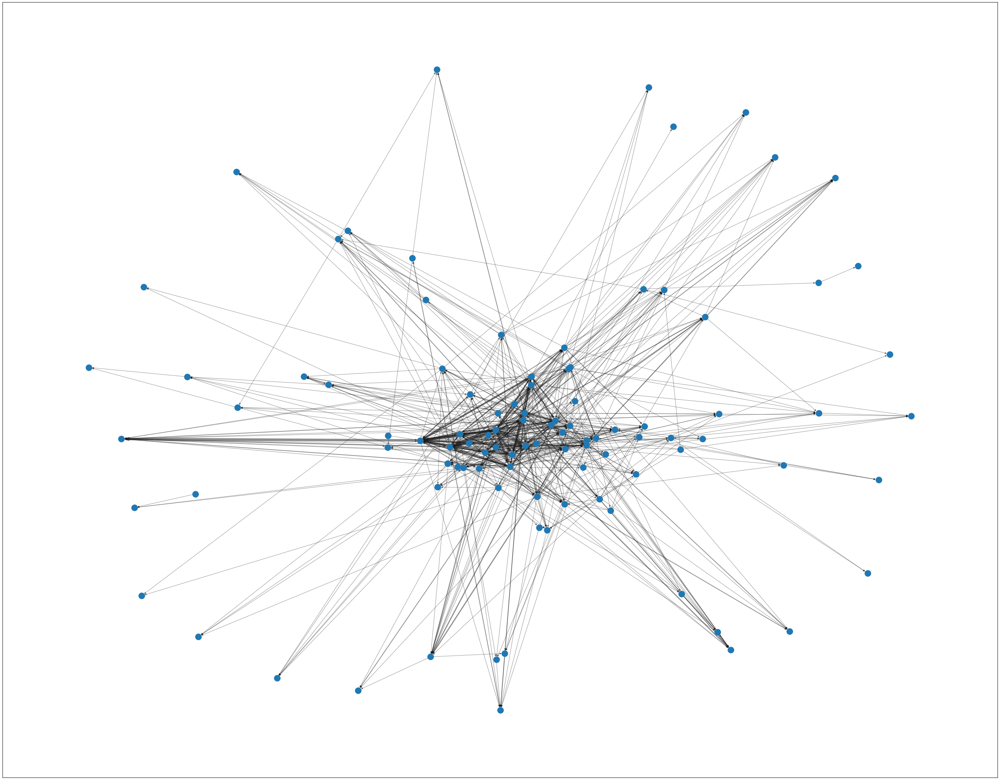

In [274]:
#pos=nx.get_node_attributes(G,'pos')
pos = nx.spring_layout(G) 
plt.figure(figsize = (50,40))
#nx.draw(G,pos)
nx.draw_networkx_nodes(G, pos, nodes = G.nodes())
edgewidthG = [d['weight'] for (u,v,d) in G.edges(data=True)]
labels = nx.get_edge_attributes(G,'weight')
nx.draw_networkx_edges(G,pos,width=edgewidthG, alpha=0.5)
plt.savefig("network_label.png", format = "png", dpi = 500)

In [275]:
##export data
nx.write_gexf(G, 'econ_network.gexf')
nx.write_gexf(GG, 'econ_network_global.gexf')

###  Rise/Decline


#### Placement in Top 100 US

In [276]:
def getdelta(df, yrnum = 3):
    '''
    This function 
    1. takes in the dataframe of all placement and yrnum(number of years with quality placement)
    2. aggregate by Source and Year
    3. Reformat the table by breaking down years
    4. Calculate the delta (changes) of placement quality 
    '''
    global rd
    rd = df.groupby(['Source', 'Year'], as_index=False).agg({'Weight':'mean'})
    rd = rd.pivot(index=rd.Source, columns='Year')['Weight'].reset_index()
    rd.set_index('Source', inplace=True)   
    
    #Calculate the delta (changes) of placement quality 
    deltalist = []
    for s in rd.index:
        l = [i for i in rd.loc[s].dropna()]
        delta = 0
        if len(l)>yrnum:
            for i in range(len(l)-1):
                delta += l[i+1]-np.mean(l[:i+1])
 
            deltalist.append(delta/len(l))
        else:
            deltalist.append(np.nan)

    rd['delta'] = deltalist.copy()
        
    rd['color'] = ['red' if x < 0 else 'green' for x in rd['delta']]            
            
            
    return rd

In [277]:
rd1 = getdelta(df)

In [278]:
#Rise
decline1 = rd1.sort_values(by=['delta'], ascending=False).head(5)
decline1

Year,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,delta,color
Source,,,,,,,,,,
state university of new york at binghamton,NaN,NaN,57.0,6.500000,43.0,NaN,NaN,435.0,90.062500,green
washington university in st. louis,NaN,NaN,127.0,88.000000,244.0,NaN,389.000000,NaN,83.375000,green
university of texas at austin,43.0,74.50,NaN,91.666667,149.5,NaN,190.000000,233.0,61.299074,green
brown university,70.0,292.50,98.0,NaN,325.5,172.000,404.500000,150.8,60.480952,green
princeton university,96.0,324.75,247.0,435.000000,239.0,285.125,289.333333,234.5,54.602827,green


In [279]:
#Decline
rise1 = rd1.sort_values(by=['delta'], ascending=True).head(5)
rise1.head()

Year,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,delta,color
Source,,,,,,,,,,
penn state university,566.0,NaN,NaN,566.000000,143.0,74.0,NaN,146.000000,-193.050000,red
university of virginia,NaN,NaN,435.00,64.000000,44.0,435.0,NaN,76.000000,-98.200000,red
university of arizona,NaN,291.000000,222.50,187.333333,95.0,98.5,NaN,NaN,-75.397222,red
duke university,NaN,231.666667,113.75,123.000000,83.0,63.5,146.0,55.666667,-51.893452,red
university of california-davis,NaN,142.000000,106.50,43.000000,41.0,50.5,50.0,13.000000,-41.615476,red


Text(0.5, 1.0, 'Most of the universities have top placements only in few years')

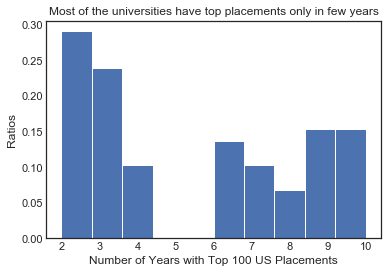

In [280]:
#Issue
plt.hist(rd1.count(axis=1), density=True)
plt.xlabel('Number of Years with Top 100 US Placements')
plt.ylabel('Ratios')
plt.title('Most of the universities have top placements only in few years')

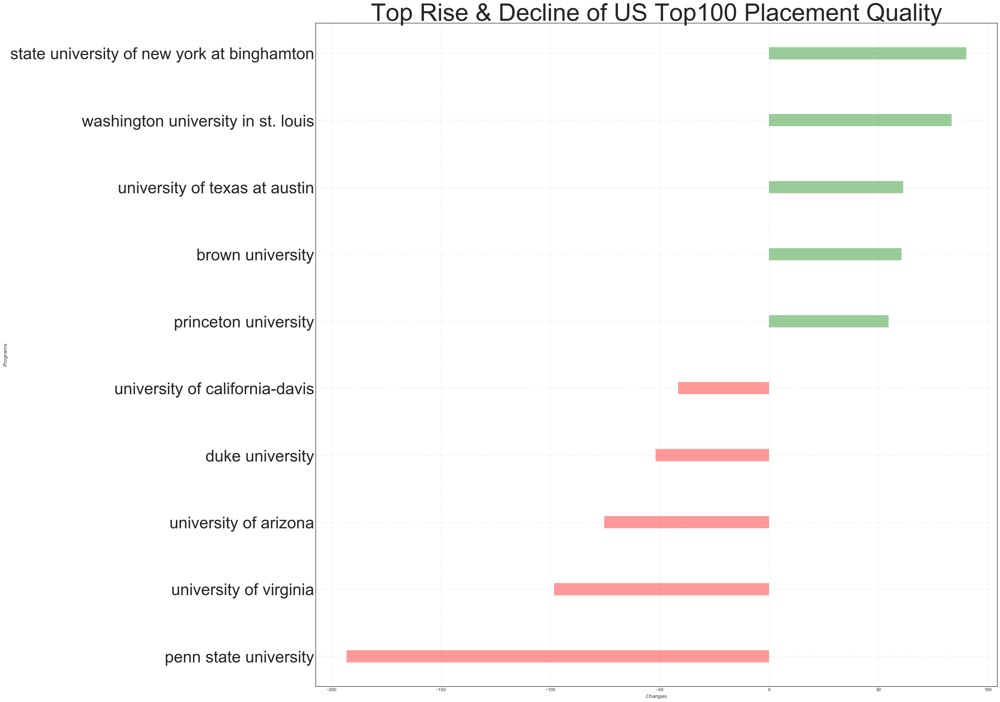

In [317]:
extreme1 = pd.concat([rise1, decline1])
plt.figure(figsize=(30,30), dpi= 100, facecolor='w', edgecolor='k')
#plt.style.use('fivethirtyeight')
plt.style.use('seaborn-white')

extreme1.sort_values('delta', inplace=True)
plt.hlines(y=extreme1.index, xmin=0, xmax=extreme1.delta, color=extreme1.color, alpha=0.4, linewidth=30)
plt.gca().set(ylabel='$Programs$', xlabel='$Changes$')
plt.yticks(extreme1.index, extreme1.index, fontsize=40)
plt.title('Top Rise & Decline of US Top100 Placement Quality', fontdict={'size':60})
plt.grid(linestyle='--', alpha=0.5)
plt.savefig('usrisedecline.png')

#### Placement in Global Universities

Previous problem: Most of the universities have top placements only in few years

* Consider all academic placements
* Use Tilburg Publication Number As Proxy
* Use discountfactors for non-tenure track positions

In [282]:
#Apply getdelta function
rd2 = getdelta(glo)

In [283]:
#Rise
rise2 = rd2.sort_values(by=['delta'], ascending=False).head(5)
rise2.head()

Year,2010,2011,2012,2013,2014,2015,2016,2017,delta,color
Source,,,,,,,,,,
carnegie mellon university,7.000000,8.000000,NaN,NaN,3.333333,226.866667,58.900000,151.000000,50.894815,green
university of connecticut,1.500000,21.000000,0.000000,213.000000,26.000000,157.600000,49.000000,NaN,37.903571,green
columbia university in the city of new york,NaN,44.400000,192.500000,169.076923,237.100000,166.080000,106.666667,160.977778,36.998264,green
university of rochester,5.500000,75.000000,125.500000,NaN,8.500000,82.571429,83.400000,146.200000,32.900510,green
brown university,81.166667,164.733333,96.088889,83.657143,358.500000,92.800000,188.533333,133.833333,29.802918,green


In [284]:
#Decline
decline2 = rd2.sort_values(by=['delta'], ascending=True).head(5)
decline2.head()

Year,2010,2011,2012,2013,2014,2015,2016,2017,delta,color
Source,,,,,,,,,,
rice university,NaN,NaN,215.333333,128.000000,0.000000,NaN,24.000000,NaN,-87.361111,red
penn state university,194.375000,85.4,56.633333,165.914286,35.953846,41.142857,56.836364,48.142857,-47.134322,red
cornell university,NaN,NaN,NaN,NaN,121.500000,112.700000,12.750000,45.888889,-37.394444,red
yale university,235.161905,206.9,198.000000,163.640000,140.325000,126.225000,134.105882,173.200000,-33.413529,red
california institute of technology,150.400000,30.0,226.120000,73.300000,102.000000,86.833333,79.000000,3.500000,-28.740272,red


In [285]:
extreme2 = pd.concat([rise2, decline2])

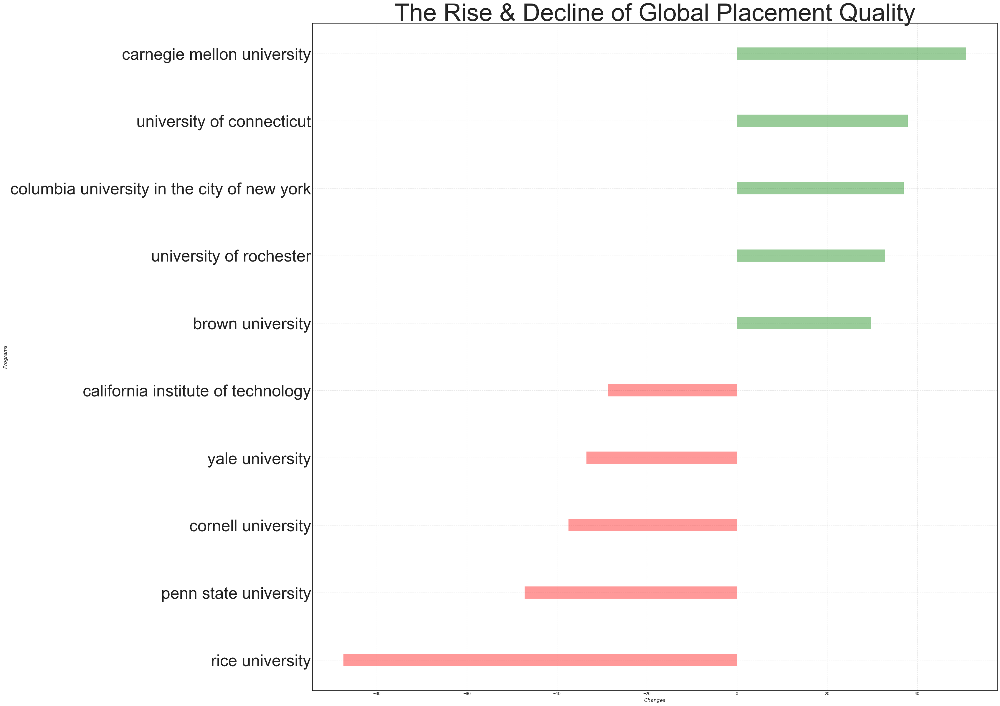

In [318]:
plt.figure(figsize=(30,30), dpi= 100, facecolor='w', edgecolor='k')
#plt.style.use('fivethirtyeight')
plt.style.use('seaborn-bright')

extreme2.sort_values('delta', inplace=True)
plt.hlines(y=extreme2.index, xmin=0, xmax=extreme2.delta, color=extreme2.color, alpha=0.4, linewidth=30)
plt.gca().set(ylabel='$Programs$', xlabel='$Changes$')
plt.yticks(extreme2.index, extreme2.index, fontsize=40)
plt.title('The Rise & Decline of Global Placement Quality', fontdict={'size':60})
plt.grid(linestyle='--', alpha=0.5)
plt.savefig('globalrisedecline.png')